In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from datetime import datetime, timedelta, date
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor



In [2]:
#datasets
players_df = pd.read_csv('../data/players.csv')
player_valuations_df = pd.read_csv('../data/player_valuations.csv')
appearances_df = pd.read_csv('../data/appearances.csv')
clubs_df = pd.read_csv('../data/clubs.csv')
competitions_df = pd.read_csv('../data/competitions.csv')
appearances_df = pd.read_csv('../data/appearances.csv')
games_df = pd.read_csv('../data/games.csv')



#players_df.head()

In [3]:
player_valuations_df

,player_id,date,market_value_in_eur,current_club_id,player_club_domestic_competition_id
0,405973,2000-01-20,150000,3057,BE1
1,342216,2001-07-20,100000,1241,SC1
2,3132,2003-12-09,400000,126,TR1
3,6893,2003-12-15,900000,984,GB1
4,10,2004-10-04,7000000,398,IT1
...,...,...,...,...,...
473670,719682,2024-06-21,50000,465,SC1
473671,780506,2024-06-21,50000,2759,SC1
473672,821905,2024-06-21,50000,2578,SC1
473673,656250,2024-06-27,300000,167,L1


In [4]:
columns = players_df.columns

print(columns)

Index(['player_id', 'first_name', 'last_name', 'name', 'last_season',
       'current_club_id', 'player_code', 'country_of_birth', 'city_of_birth',
       'country_of_citizenship', 'date_of_birth', 'sub_position', 'position',
       'foot', 'height_in_cm', 'contract_expiration_date', 'agent_name',
       'image_url', 'url', 'current_club_domestic_competition_id',
       'current_club_name', 'market_value_in_eur',
       'highest_market_value_in_eur'],
      dtype='object')


# Calculate the age of each player 

In [5]:

#transforms date birth column into a datetime format
players_df['date_of_birth'] = pd.to_datetime(players_df['date_of_birth'])

# drop players with no date of birth
players_df = players_df[players_df['date_of_birth'].isnull() == False]
now = datetime.now() #here we get the date time of the current day
#calculate players age 
players_df['age'] = (now - players_df['date_of_birth']).apply(lambda x: x.days) / 365.25
players_df['age'] = players_df['age'].round().astype(int) 


# Calculate the contract remaining of each player

In [6]:

players_df['contract_expiration_date'] = pd.to_datetime(players_df['contract_expiration_date'])

# drop players with no contract_expiration_date
players_df = players_df[players_df['contract_expiration_date'].isnull() == False]
now = datetime.now()
players_df['term_days_remaining'] = (players_df['contract_expiration_date']- now).apply(lambda x: x.days)

In [7]:
# add year to player valuations
player_valuations_df['datetime']=pd.to_datetime(player_valuations_df['date'], format="%Y-%m-%d")
player_valuations_df['year']=player_valuations_df['datetime'].dt.year

# add year to player appearances
appearances_df['datetime']=pd.to_datetime(appearances_df['date'], format="%Y-%m-%d")
appearances_df['year']=appearances_df['datetime'].dt.year

In [8]:
#add position to player valuations
position_df=players_df.copy()
position_df=position_df.drop(['name', 'current_club_id', 'current_club_name', 'country_of_citizenship', 'country_of_birth', 'city_of_birth', 'date_of_birth', 'foot', 'height_in_cm', 'market_value_in_eur', 'highest_market_value_in_eur', 'agent_name', 'contract_expiration_date', 'current_club_domestic_competition_id', 'first_name', 'last_name', 'player_code', 'image_url', 'last_season', 'url', 'age'], axis=1)
player_valuations_df=player_valuations_df.merge(position_df, left_on='player_id', right_on='player_id')

#add position to appearances
value_df=players_df.copy()
value_df=value_df.drop(['name', 'current_club_id', 'current_club_name', 'country_of_citizenship', 'country_of_birth', 'city_of_birth', 'date_of_birth', 'foot', 'height_in_cm', 'sub_position', 'highest_market_value_in_eur', 'agent_name', 'contract_expiration_date', 'current_club_domestic_competition_id', 'first_name', 'last_name', 'player_code', 'image_url', 'last_season', 'url', 'age'], axis=1)
appearances_df1=value_df.merge(appearances_df, left_on='player_id', right_on='player_id')

## Filtering and Visualizing Player Valuations Over Time

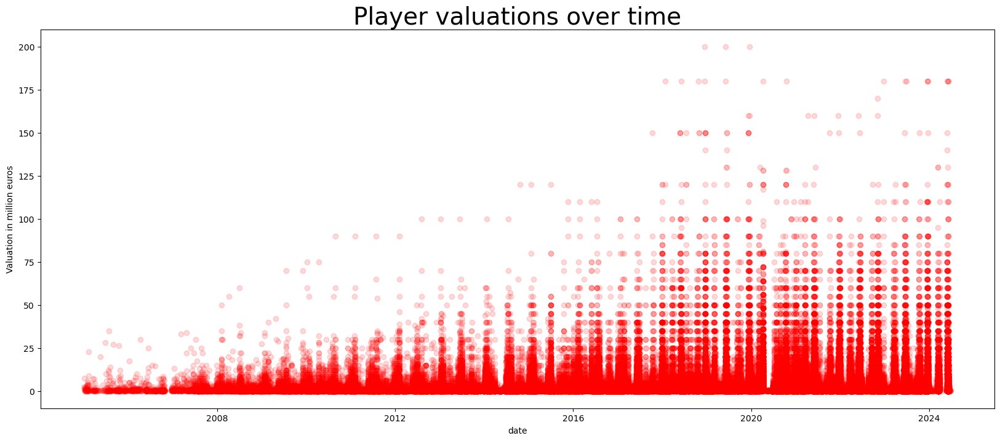

In [9]:
#filter range
player_valuations_df = player_valuations_df[(player_valuations_df.year > 2004 ) & (player_valuations_df.year < 2025 )]

high_value_player_valuations_df = player_valuations_df[(player_valuations_df.market_value_in_eur > 40000000 )]
positions=players_df.position.unique()


plt.figure(figsize=(20,8))
plt.scatter(player_valuations_df['datetime'],y=player_valuations_df['market_value_in_eur']/1000000, c='red',alpha=0.15)
plt.xlabel('date');plt.ylabel('Valuation in million euros')
plt.title('Player valuations over time',fontsize=28)
plt.show()



## Visualizing Player Valuation Data Over Time

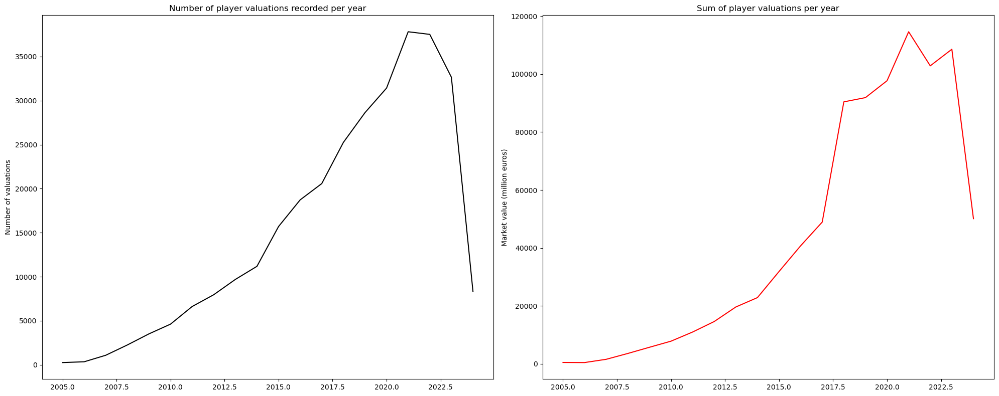

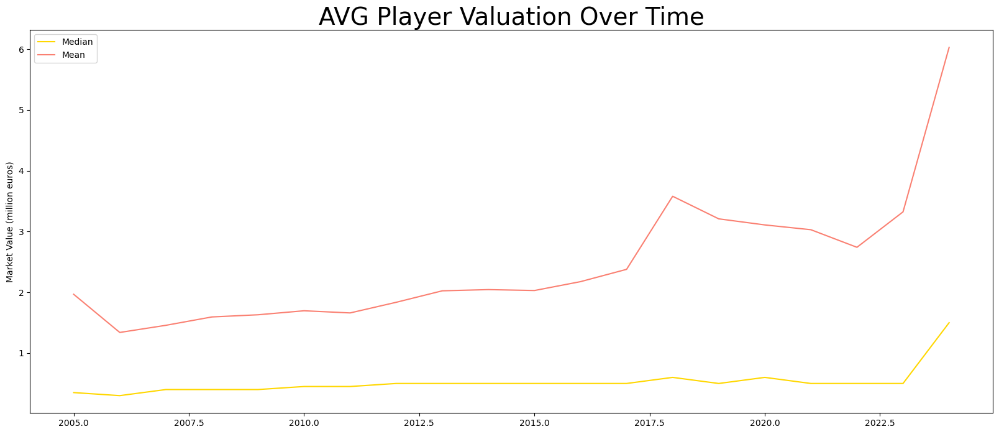

In [10]:
# Create a figure with a specific size and two subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Group data by year and count the number of entries
year_counts = player_valuations_df.groupby('year')['market_value_in_eur'].count()

# Group data by year and sum the market values
year_sums = player_valuations_df.groupby('year')['market_value_in_eur'].sum()

# Group data by year and get the maximum market value per year
year_maxs = player_valuations_df.groupby('year')['market_value_in_eur'].max()

# Group data by year and get the minimum market value per year
year_mins = player_valuations_df.groupby('year')['market_value_in_eur'].min()

# Group data by year and get the median market value per year
year_medians = player_valuations_df.groupby('year')['market_value_in_eur'].median()

# Group data by year and get the mean market value per year
year_means = player_valuations_df.groupby('year')['market_value_in_eur'].mean()

# Plot the number of player valuations recorded per year
axes[0].plot(year_counts.index, year_counts, color='black')
axes[0].set_title('Number of player valuations recorded per year')
axes[0].set_ylabel('Number of valuations')

# Plot the sum of player valuations per year
axes[1].plot(year_sums.index, year_sums / 1000000, color='red')
axes[1].set_title('Sum of player valuations per year')
axes[1].set_ylabel('Market value (million euros)')

plt.tight_layout()
plt.show()

# Create a new figure to plot avg player valuation over time
plt.figure(figsize=(20, 8))
plt.title('AVG Player Valuation Over Time', fontsize=28)
plt.plot(year_medians.index, year_medians / 1000000, color='Gold', label='Median')
plt.plot(year_means.index, year_means / 1000000, color='salmon', label='Mean')
plt.ylabel('Market Value (million euros)')
plt.legend()
plt.show()


ValueError: num must be an integer with 1 <= num <= 4, not 5

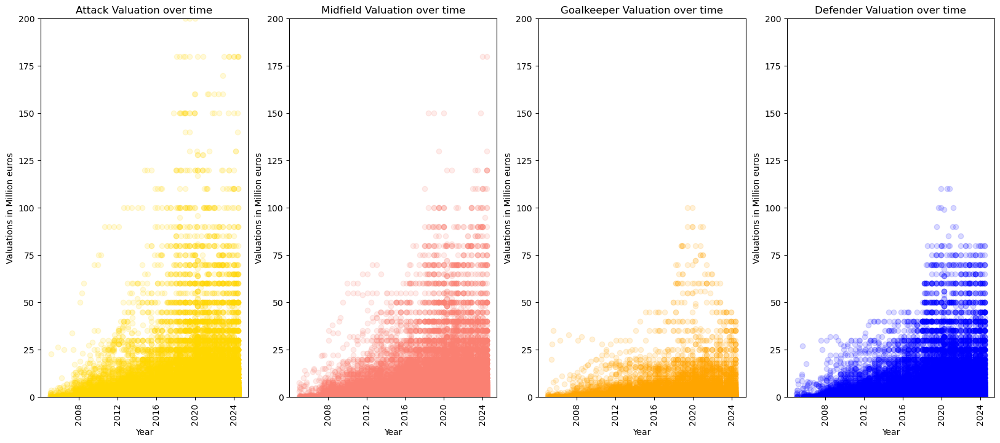

In [11]:

plt.figure(figsize=(20, 8))
colors = ['gold', 'salmon', 'orange', 'blue', 'g']

# Loop through each position and create a subplot
for idx, position in enumerate(positions):
    ax = plt.subplot(1, 4, idx + 1)
    
    filtered_df = player_valuations_df[player_valuations_df['position'] == position]
    
   
    ax.scatter(filtered_df['datetime'], filtered_df['market_value_in_eur'] / 1000000, 
               color=colors[idx], alpha=0.15)
    
    
    ax.set_xlabel('Year')
    ax.set_ylabel('Valuations in Million euros')
    ax.set_title(f'{position} Valuation over time')
    ax.set_ylim(0, 200)
    ax.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()



A scatter plot analysis of player valuations from 2006 to 2024 reveals a general upward trend in player values.  However, the distribution is skewed, with the vast majority of players concentrated at the lower end of the scale, typically below €30 million.

Further analysis highlights a clear position-based disparity. Attacking positions tend to dominate the highest valuation brackets, while goalkeepers generally occupy the lower end of the value spectrum.


# overview of player dataset

Text(0, 0.5, 'number of players')

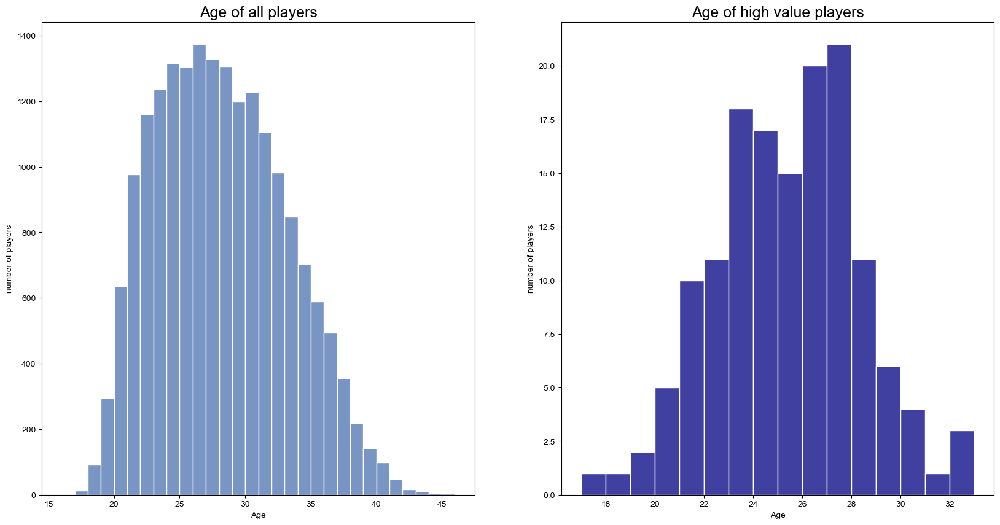

In [12]:

#remove players with no Market Value
players_df1 = players_df[players_df.highest_market_value_in_eur.isnull() == False]
#order by Market Value
players_df1 = players_df1.sort_values("highest_market_value_in_eur", ascending = False)
#filter by season and value
players_df1 = players_df[players_df['last_season'] >= 2023]
players_df1 = players_df1[players_df1['highest_market_value_in_eur'] >= 10000000]
high_value_players_df = players_df1[(players_df1.market_value_in_eur > 40000000 )]
positions=players_df.position.unique()

# Show player age distribution
f = plt.figure(figsize=(20,10))
ax = f.add_subplot(121)
ax2 = f.add_subplot(122)
plt.subplot(1, 2, 1)
sns.set(rc={'figure.figsize':(20,10)})
sns.histplot(x='age',data=players_df, binwidth=1,color='b')
plt.title("Age of all players",fontsize=18)
plt.xlabel('Age'); plt.ylabel('number of players')
plt.subplot(1, 2, 2)
sns.histplot(x='age',data=high_value_players_df, binwidth=1,color='navy')
plt.title("Age of high value players",fontsize=18)
plt.xlabel('Age'); plt.ylabel('number of players')



Text(0, 0.5, 'number of players')

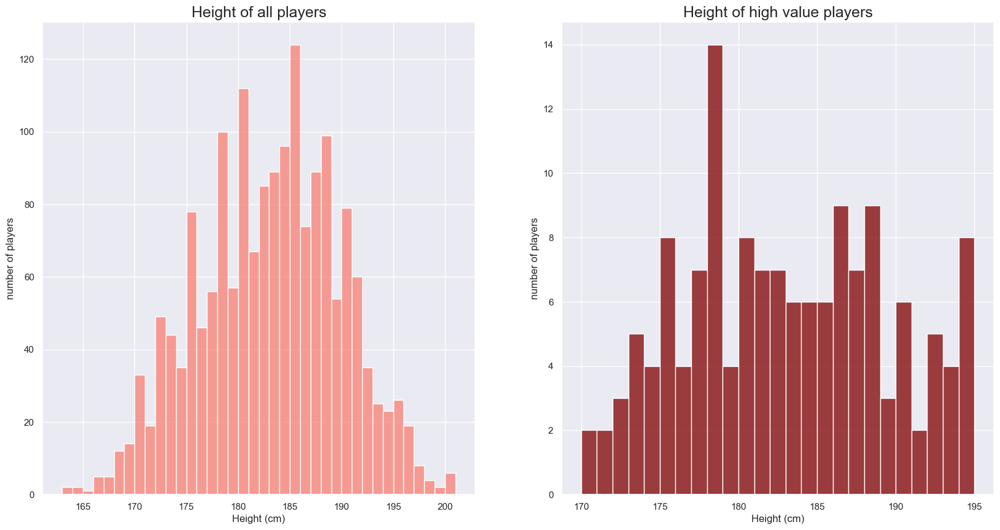

In [13]:
# Show player height distribution
players_df3 = players_df1[players_df1.height_in_cm.isnull() == False]
f = plt.figure(figsize=(20,10))
ax = f.add_subplot(121)
ax2 = f.add_subplot(122)
plt.subplot(1, 2, 1)
sns.set(rc={'figure.figsize':(20,10)})
sns.histplot(x='height_in_cm',data=players_df3, binwidth=1,color='salmon')
plt.title("Height of all players",fontsize=18)
plt.xlabel('Height (cm)'); plt.ylabel('number of players')
plt.subplot(1, 2, 2)
sns.histplot(x='height_in_cm',data=high_value_players_df, binwidth=1,color='maroon')
plt.title("Height of high value players",fontsize=18)
plt.xlabel('Height (cm)'); plt.ylabel('number of players')



Text(0, 0.5, 'number of players')

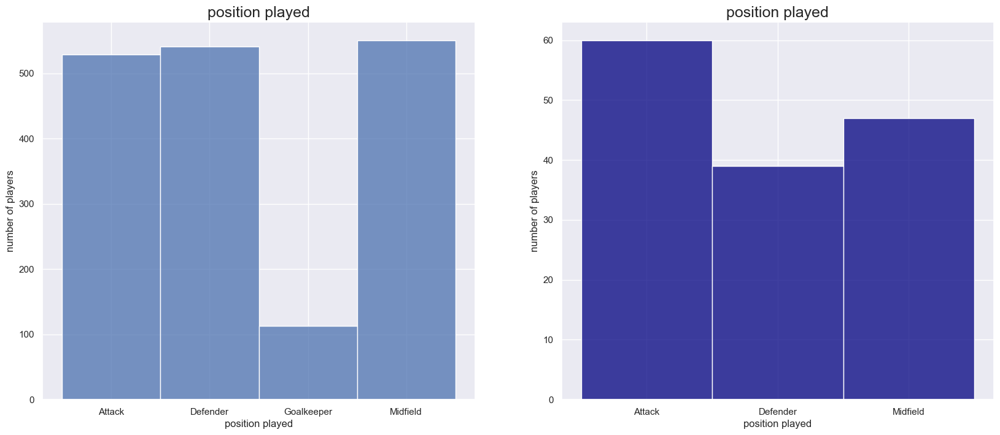

In [14]:
# Show position data
players_df1 = players_df1.sort_values("position", ascending = True)
high_value_players_df1 = high_value_players_df.sort_values("position", ascending = True)
f = plt.figure(figsize=(20,8))
ax = f.add_subplot(121)
ax2 = f.add_subplot(122)
plt.subplot(1, 2, 1)
plt.title("position played",fontsize=18);plt.grid(True)
sns.histplot(x='position',data=players_df1, binwidth=1,color='b')
plt.xlabel('position played'); plt.ylabel('number of players')
plt.subplot(1, 2, 2)
sns.histplot(x='position',data=high_value_players_df1, binwidth=1,color='navy')
plt.title("position played",fontsize=18);plt.grid(True)
plt.xlabel('position played'); plt.ylabel('number of players')



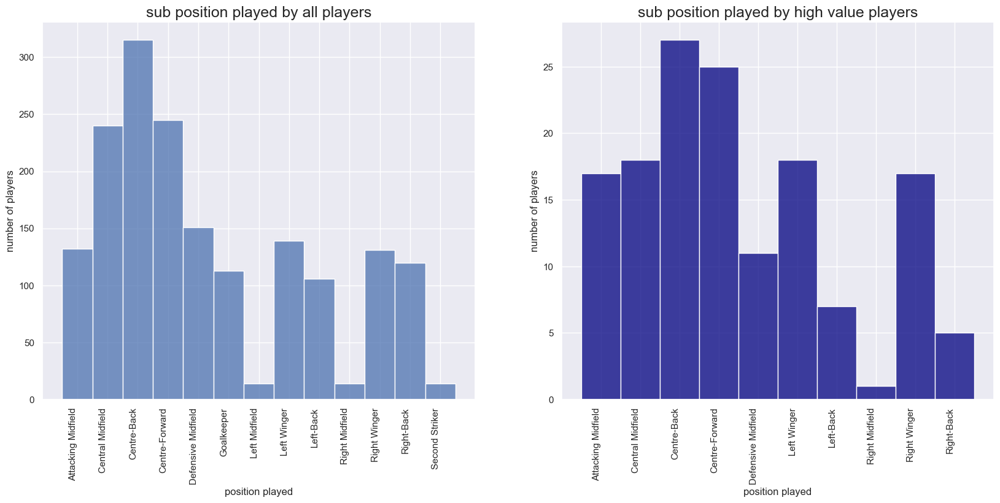

In [15]:
# Show subposition data
players_df1 = players_df1.sort_values("sub_position", ascending = True)
high_value_players_df1 = high_value_players_df.sort_values("sub_position", ascending = True)
f = plt.figure(figsize=(20,8))
ax = f.add_subplot(121)
ax2 = f.add_subplot(122)
plt.subplot(1, 2, 1)
sns.histplot(x='sub_position',data=players_df1, binwidth=1,color='b')
plt.title("sub position played by all players",fontsize=18);plt.grid(True)
plt.xlabel('position played'); plt.ylabel('number of players')
plt.xticks(rotation=90, ha='right');
plt.subplot(1, 2, 2)
sns.histplot(x='sub_position',data=high_value_players_df1, binwidth=1,color='navy')
plt.title("sub position played by high value players",fontsize=18);plt.grid(True)
plt.xlabel('position played'); plt.ylabel('number of players')
plt.xticks(rotation=90, ha='right');



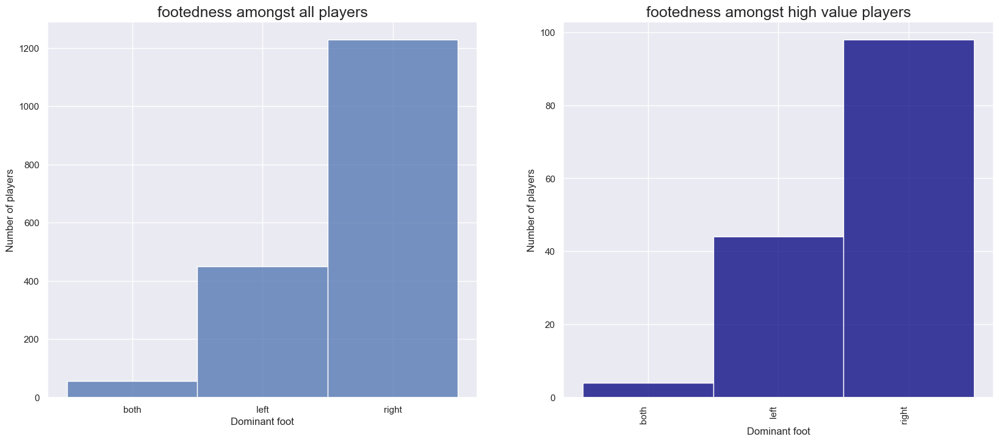

In [16]:
# Show  footedness data
players_df1 = players_df1.sort_values("foot", ascending = True)
high_value_players_df1 = high_value_players_df1.sort_values("foot", ascending = True)
f = plt.figure(figsize=(20,8))
ax = f.add_subplot(121)
ax2 = f.add_subplot(122)
plt.subplot(1, 2, 1)
sns.histplot(x='foot',data=players_df1, binwidth=1,color='b')
plt.title("footedness amongst all players",fontsize=18);plt.grid(True)
plt.xlabel('Dominant foot'); plt.ylabel('Number of players')
plt.subplot(1, 2, 2)
sns.histplot(x='foot',data=high_value_players_df1, binwidth=1,color='navy')
plt.title("footedness amongst high value players",fontsize=18);plt.grid(True)
plt.xlabel('Dominant foot'); plt.ylabel('Number of players')
plt.xticks(rotation=90, ha='right');

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\627086710.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=sorted_players_df1["age"].astype(str), y=sorted_players_df1['market_value_in_eur'] / 1000000, palette=color_dict)


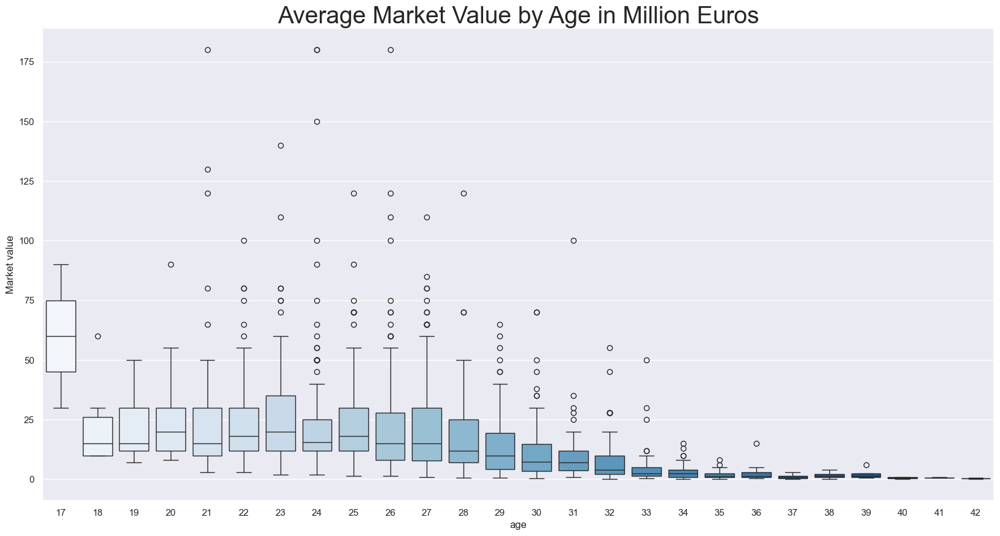

In [17]:
# Group by age and calculate the mean market value
agegroups = players_df1.loc[:, ['market_value_in_eur', 'age']] \
    .groupby(['age']) \
    .mean() \
    .sort_values(by='market_value_in_eur', ascending=False)


sns.set(rc={'figure.figsize': (20, 10)})

unique_ages = np.sort(players_df1["age"].unique())
palette = sns.color_palette("Blues", len(unique_ages))

#dictionary mapping each age to a different color
color_dict = {str(age): palette[i] for i, age in enumerate(unique_ages)}


sorted_players_df1 = players_df1.sort_values(by='age')


sns.boxplot(x=sorted_players_df1["age"].astype(str), y=sorted_players_df1['market_value_in_eur'] / 1000000, palette=color_dict)
plt.ylabel('Market value')
plt.title('Average Market Value by Age in Million Euros', fontsize=28)
plt.show()

In [18]:
import scipy.stats as stats

# Extract the age and market value columns
ages = players_df1['age']
market_values = players_df1['market_value_in_eur']

# Perform the Pearson correlation test
correlation_coefficient, p_value = stats.pearsonr(ages, market_values)

print(f"Correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

# Interpretation
if p_value < 0.05:
    print("There is a statistically significant correlation between age and market value.")
else:
    print("There is no statistically significant correlation between age and market value.")

Correlation coefficient: -0.38814177441902054
P-value: 1.9032646501432203e-63
There is a statistically significant correlation between age and market value.


Observations on age
The age distribution of players is a skewed normal distribution starting at 17 years of age and going up 50 with an average age of 29. Players with a market value to over 400,000 euros form a normal distribution ranging from 19 to 32 years of age, with a significant number at age 25.

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\1988217475.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=sorted_players_df3["height_in_cm"].astype(str), y=sorted_players_df3['market_value_in_eur'] / 1000000, palette=color_dict)


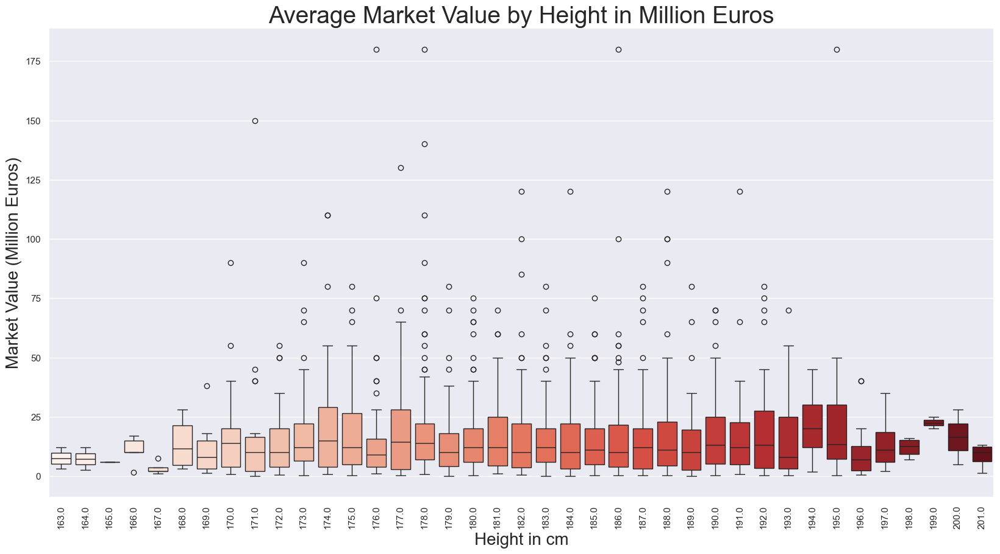

In [19]:
# Drop players with no height
players_df3 = players_df1[players_df1['height_in_cm'] >= 1]

# Calculate the average market value by height
heightgroups = players_df3.loc[:, ['market_value_in_eur', 'height_in_cm']] \
    .groupby(['height_in_cm']) \
    .mean() \
    .sort_values(by='market_value_in_eur', ascending=False)


sns.set(rc={'figure.figsize': (20, 10)})

unique_heights = np.sort(players_df3["height_in_cm"].unique())
palette = sns.color_palette("Reds", len(unique_heights))

# dictionary mapping each height to a different color
color_dict = {str(height): palette[i] for i, height in enumerate(unique_heights)}


sorted_players_df3 = players_df3.sort_values(by='height_in_cm')


sns.boxplot(x=sorted_players_df3["height_in_cm"].astype(str), y=sorted_players_df3['market_value_in_eur'] / 1000000, palette=color_dict)

plt.xlabel('Height in cm', fontsize=20)
plt.ylabel('Market Value (Million Euros)', fontsize=20)
plt.title('Average Market Value by Height in Million Euros', fontsize=28)
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [20]:
import scipy.stats as stats

# Drop players with no height
players_df3 = players_df1[players_df1['height_in_cm'] >= 1]

# Extract the height and market value columns
heights = players_df3['height_in_cm']
market_values = players_df3['market_value_in_eur']


correlation_coefficient, p_value = stats.pearsonr(heights, market_values)

print(f"Correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

# Interpretation
if p_value < 0.05:
    print("There is a statistically significant correlation between height and market value.")
else:
    print("There is no statistically significant correlation between height and market value.")


Correlation coefficient: 0.0017906070836846196
P-value: 0.9406049475569684
There is no statistically significant correlation between height and market value.


# analysis of market value 

In [21]:
high_value_players_df2=high_value_players_df1.sort_values('market_value_in_eur',ascending = False)
highest_value_players_df2=high_value_players_df1.sort_values('highest_market_value_in_eur',ascending = False)

display((high_value_players_df2[['name',"market_value_in_eur"]]).head(15))
display(highest_value_players_df2[['name',"highest_market_value_in_eur"]].head(15))

,name,market_value_in_eur
19868,Vinicius Junior,180000000.0
18686,Kylian Mbappé,180000000.0
21476,Erling Haaland,180000000.0
25408,Jude Bellingham,180000000.0
21165,Phil Foden,150000000.0
21896,Bukayo Saka,140000000.0
25763,Florian Wirtz,130000000.0
25372,Jamal Musiala,120000000.0
19748,Federico Valverde,120000000.0
19408,Rodri,120000000.0


,name,highest_market_value_in_eur
18686,Kylian Mbappé,200000000.0
19868,Vinicius Junior,180000000.0
25408,Jude Bellingham,180000000.0
21476,Erling Haaland,180000000.0
21165,Phil Foden,150000000.0
9419,Harry Kane,150000000.0
10048,Mohamed Salah,150000000.0
7171,Kevin De Bruyne,150000000.0
21896,Bukayo Saka,140000000.0
25763,Florian Wirtz,130000000.0


### nexxt should merge data sets and do a pearson correlation test to see feutures

### then avaliate a prediction model for market value

In [22]:
# Drop unnecessary columns from players_df
columns_to_drop = ['current_club_id', 'city_of_birth', 'date_of_birth',
                   'first_name', 'last_name', 'player_code', 'image_url', 'url']
merged_players_df = players_df.drop(columns=columns_to_drop)

# Add new columns to merged_players_df
new_columns = ['club_value', 'squad_size', 'goals', 'goals_2023', 'games_2023',
               'assists_2023', 'minutes_played_2023', 'goals_against_2023',
               'goals_for_2023', 'clean_sheet_2023']
for col in new_columns:
    merged_players_df[col] = pd.NA

# Populate new columns based on club data
for player_id in merged_players_df['player_id'].unique():
    club_id = players_df.loc[players_df['player_id'] == player_id, 'current_club_id'].values[0]
    try:
        club_value = clubs_df.loc[clubs_df['club_id'] == club_id, 'total_market_value'].values[0]
    except IndexError:
        club_value = pd.NA
    squad_size = clubs_df.loc[clubs_df['club_id'] == club_id, 'squad_size'].values[0]
    
    merged_players_df.loc[merged_players_df['player_id'] == player_id, 'club_value'] = club_value
    merged_players_df.loc[merged_players_df['player_id'] == player_id, 'squad_size'] = squad_size

# Reorder columns
ordered_columns = ['player_id', 'games_2023', 'minutes_played_2023', 'goals_2023', 'assists_2023', 
                   'goals_against_2023', 'goals_for_2023', 'clean_sheet_2023', 'name', 'position', 
                   'sub_position', 'last_season', 'foot', 'height_in_cm', 'age', 
                   'country_of_citizenship', 'country_of_birth', 'current_club_name', 'club_value', 
                   'squad_size', 'current_club_domestic_competition_id', 'agent_name', 
                   'contract_expiration_date', 'term_days_remaining', 'market_value_in_eur', 
                   'highest_market_value_in_eur']
merged_players_df = merged_players_df[ordered_columns]

# Merge games and appearances data
games_and_appearances_df = appearances_df.merge(games_df, on='game_id', how='left')

print('Player and club data merged')
# print(games_and_appearances_df.shape)
# print(games_and_appearances_df.columns)



Player and club data merged


In [29]:
# Merge games and appearances
games_and_appearances_df = appearances_df.merge(games_df, on=['game_id'], how='left')
season = 2023

def player_stats(player_id, season, df):
    player_df = df[(df['player_id'] == player_id) & (df['season'] == season)]
    
    if player_df.empty:
        return pd.DataFrame({
            'player_id': [player_id],
            'season': [season],
            'goals': [0],
            'games': [0],
            'assists': [0],
            'minutes_played': [0],
            'goals_for': [0],
            'goals_against': [0],
            'clean_sheet': [0],
            'yellow_cards': [0],
            'red_cards': [0]
        })
    
    player_df['goals_for'] = player_df.apply(
        lambda row: row['home_club_goals'] if row['home_club_id'] == row['player_club_id'] 
        else row['away_club_goals'], axis=1)
    
    player_df['goals_against'] = player_df.apply(
        lambda row: row['away_club_goals'] if row['home_club_id'] == row['player_club_id'] 
        else row['home_club_goals'], axis=1)
    
    player_df['clean_sheet'] = player_df['goals_against'].apply(lambda x: 1 if x == 0 else 0)
    
    aggregated_df = player_df.groupby(['player_id', 'season'], as_index=False).agg({
        'goals': 'sum',
        'game_id': 'nunique',
        'assists': 'sum',
        'minutes_played': 'sum',
        'goals_for': 'sum',
        'goals_against': 'sum',
        'clean_sheet': 'sum',
        'yellow_cards': 'sum',
        'red_cards': 'sum'
    }).rename(columns={'game_id': 'games'})
    
    return aggregated_df

# Iterate through players
for index, row in merged_players_df.iterrows():
    player_id = row['player_id']
    stats = player_stats(player_id, season, games_and_appearances_df)
    
    if not stats.empty:
        stats_row = stats.iloc[0]
        for stat in ['games', 'goals', 'assists', 'minutes_played', 'goals_for', 'goals_against', 'clean_sheet', 'yellow_cards', 'red_cards']:
            merged_players_df.at[index, f'{stat}_{season}'] = stats_row[stat]

print('Appearance, goal, and card data merged')
print(merged_players_df.info())


C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['clean_sheet'] = player_df['goals_against'].apply(lambda x: 1 if x == 0 else 0)
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a c

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['clean_sheet'] = player_df['goals_against'].apply(lambda x: 1 if x == 0 else 0)
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a c

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['clean_sheet'] = player_df['goals_against'].apply(lambda x: 1 if x == 0 else 0)
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a c

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['clean_sheet'] = player_df['goals_against'].apply(lambda x: 1 if x == 0 else 0)
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a c

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_for'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

Appearance, goal, and card data merged
<class 'pandas.core.frame.DataFrame'>
Index: 18667 entries, 9 to 30516
Data columns (total 28 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   player_id                             18667 non-null  int64         
 1   games_2023                            18667 non-null  object        
 2   minutes_played_2023                   18667 non-null  object        
 3   goals_2023                            18667 non-null  object        
 4   assists_2023                          18667 non-null  object        
 5   goals_against_2023                    18667 non-null  object        
 6   goals_for_2023                        18667 non-null  object        
 7   clean_sheet_2023                      18667 non-null  object        
 8   name                                  18667 non-null  object        
 9   position                              

C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['goals_against'] = player_df.apply(
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_df['clean_sheet'] = player_df['goals_against'].apply(lambda x: 1 if x == 0 else 0)
C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\3214229373.py:23: SettingWithCopyWarning: 
A value is trying to be set on a c

## Pearson correlation

Index(['games_2023', 'minutes_played_2023', 'goals_2023', 'assists_2023',
       'goals_against_2023', 'goals_for_2023', 'clean_sheet_2023', 'age',
       'club_value', 'squad_size', 'term_days_remaining',
       'market_value_in_eur', 'highest_market_value_in_eur',
       'yellow_cards_2023', 'red_cards_2023'],
      dtype='object')


<Axes: title={'center': 'Pearson Correlation of Features'}>

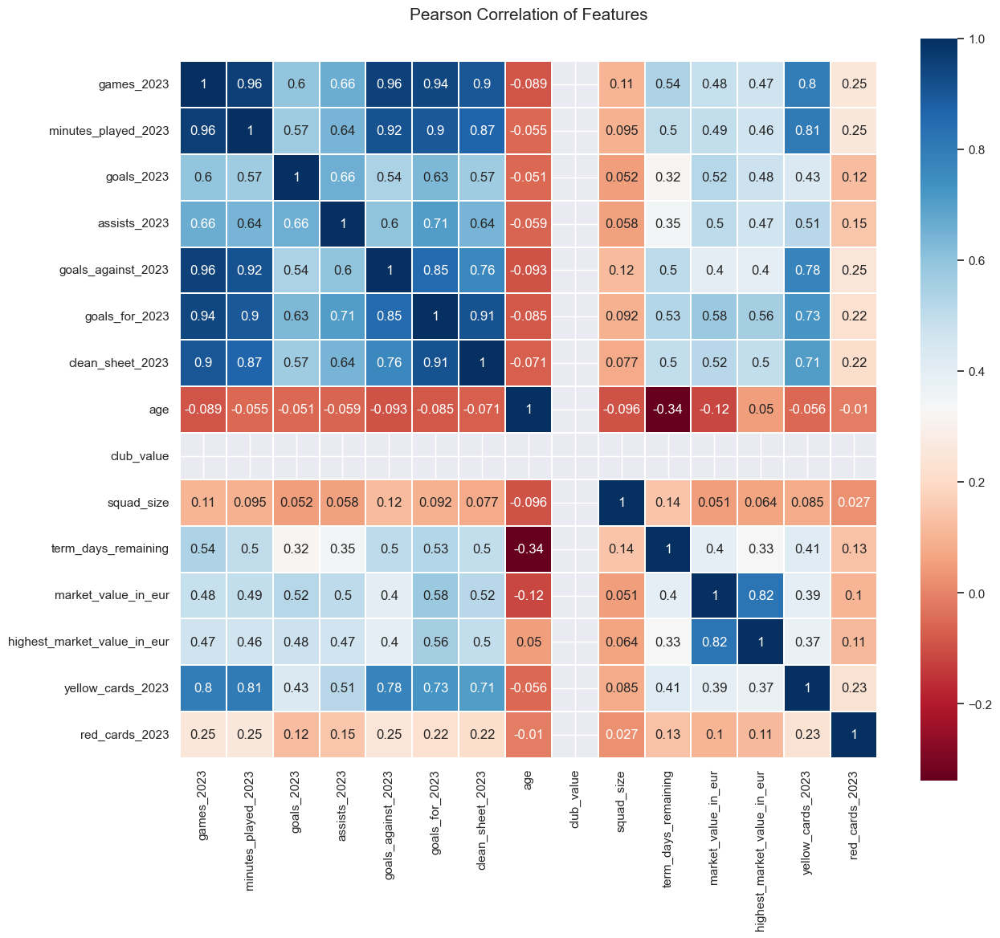

In [30]:
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
features_df=merged_players_df.drop(['player_id','name','position','sub_position','last_season','foot','height_in_cm','country_of_citizenship','country_of_birth','current_club_name','current_club_domestic_competition_id','agent_name','contract_expiration_date'],axis=1)
print(features_df.columns)
sns.heatmap(features_df.astype(float).corr(),linewidths=0.1,vmax=1.0,square=True, cmap=colormap, linecolor='white', annot=True)

Accuracy: 0.10151402030196865


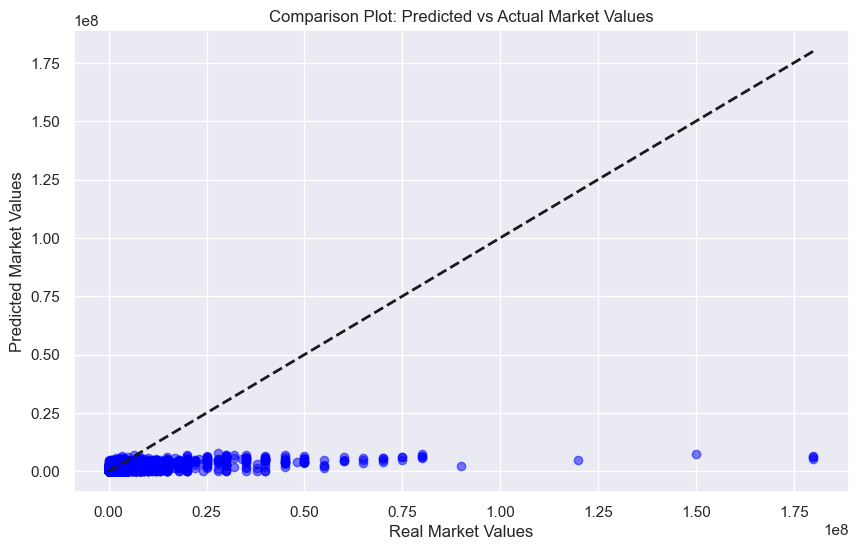

In [31]:
#separate numeric columns
NUMERIC_COLUMNS=['goals_2023','goals_against_2023', 'goals_for_2023','games_2023','assists_2023','minutes_played_2023','age','squad_size']
OTHER_COLUMNS=['position','sub_position','last_season','foot','height_in_cm','country_of_citizenship','country_of_birth','current_club_name','current_club_domestic_competition_id','agent_name','contract_expiration_date']
#drop nan
merged_players_df=merged_players_df.dropna(subset=['market_value_in_eur'])
# create test and training data
X = merged_players_df[NUMERIC_COLUMNS].fillna(-1000)
y=merged_players_df['market_value_in_eur']
#split test and training data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=21)
#model data
clf = SVR(kernel="linear")
clf.fit(X_train, y_train)
#assess accurancy of model
print("Accuracy: {}".format(clf.score(X_test, y_test)))
#generate predictions
test = X_test[NUMERIC_COLUMNS].fillna(-1000)
Submission=clf.predict(test)





plt.figure(figsize=(10, 6))
plt.scatter(y_test, Submission, color='blue', alpha=0.5)  # Scatter plot of actual vs predicted
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Diagonal line
plt.xlabel('Real Market Values')
plt.ylabel('Predicted Market Values')
plt.title('Comparison Plot: Predicted vs Actual Market Values')
plt.grid(True)
plt.show()

In [32]:
#filter out only Gb players
merged_players_df1 = merged_players_df[(merged_players_df.current_club_domestic_competition_id=='GB1')]
# convert position categories to Columns for test data
dummies=pd.get_dummies(merged_players_df1[['position']], prefix_sep='_') #position
merged_players_df1 = pd.concat([merged_players_df1, dummies], axis=1) 
print('initial feature engineering complete') #print(merged_players_df1.head())

initial feature engineering complete


In [33]:
#separate numeric columns
NUMERIC_COLUMNS=['goals_2023','goals_against_2023', 'goals_for_2023','games_2023','assists_2023','minutes_played_2023','age','squad_size','term_days_remaining','position_Attack','position_Defender','position_Goalkeeper','position_Midfield']
OTHER_COLUMNS=['sub_position','last_season','foot','height_in_cm','country_of_citizenship','country_of_birth','current_club_name','current_club_domestic_competition_id','agent_name','contract_expiration_date']
# create test and training data
y=merged_players_df1['market_value_in_eur']
X = merged_players_df1[NUMERIC_COLUMNS].fillna(-1000)
#split test and training data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=21)
#model data
clf = GradientBoostingRegressor(random_state=0)
clf.fit(X_train, y_train)
print("Accuracy: {}".format(clf.score(X_test, y_test)))

Accuracy: 0.7157852926839479


In [34]:
# convert position categories to Columns for test data
dummies=pd.get_dummies(merged_players_df1[['sub_position']], prefix_sep='_') #sub position
merged_players_df1 = pd.concat([merged_players_df1, dummies], axis=1) 
dummies=pd.get_dummies(merged_players_df1[['foot']], prefix_sep='_') #foot
merged_players_df1 = pd.concat([merged_players_df1, dummies], axis=1) 
display(merged_players_df1[NUMERIC_COLUMNS].head())

,goals_2023,goals_against_2023,goals_for_2023,games_2023,assists_2023,minutes_played_2023,age,squad_size,term_days_remaining,position_Attack,position_Defender,position_Goalkeeper,position_Midfield
122,0,0,0,0,0,0,40,25,-188,False,False,True,False
188,0,26,34,20,2,955,38,35,359,False,False,False,True
251,0,0,0,0,0,0,38,26,-188,False,False,True,False
608,0,0,0,0,0,0,41,25,-372,False,True,False,False
758,0,0,0,0,0,0,39,30,359,True,False,False,False


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 485
[LightGBM] [Info] Number of data points in the train set: 933, number of used features: 23
[LightGBM] [Info] Start training from score 9726618.435155


C:\Users\José Martins\AppData\Local\Temp\ipykernel_18476\4154993287.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


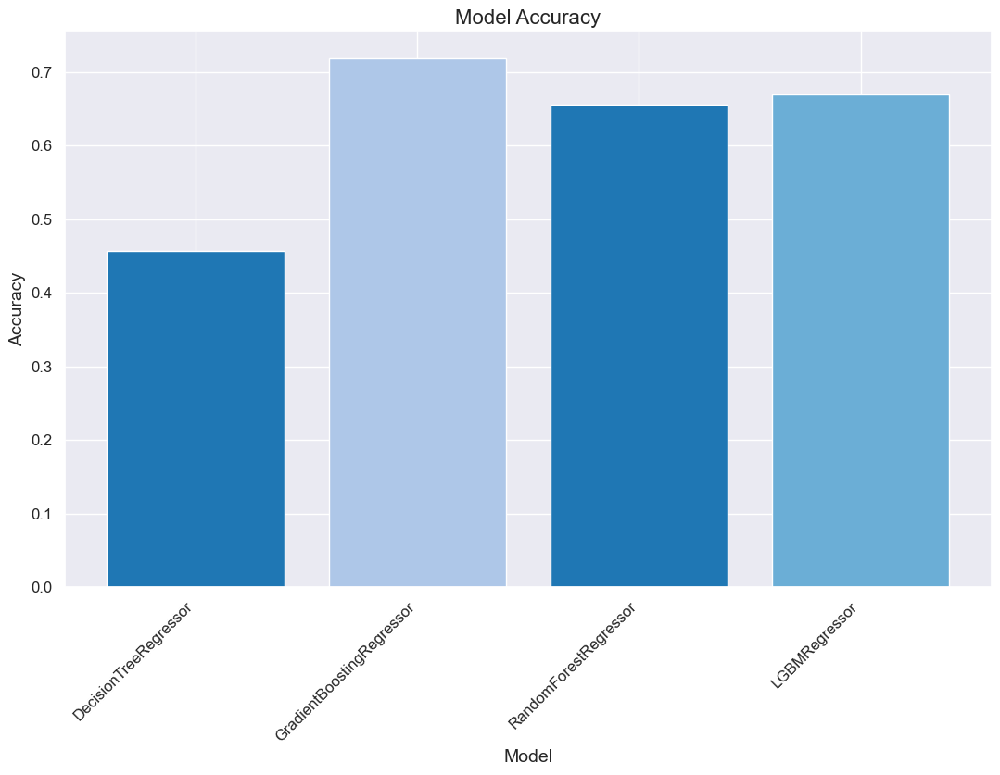

,model,accuracy
0,DecisionTreeRegressor,0.457164
1,GradientBoostingRegressor,0.718815
2,RandomForestRegressor,0.656332
3,LGBMRegressor,0.669911


In [35]:
# Separate numeric columns and other columns
NUMERIC_COLUMNS = ['goals_2023', 'goals_against_2023', 'goals_for_2023', 'games_2023', 'assists_2023',
                   'minutes_played_2023', 'age', 'height_in_cm', 'squad_size', 'term_days_remaining',
                   'position_Attack', 'position_Defender', 'position_Goalkeeper', 'position_Midfield',
                   'sub_position_Attacking Midfield', 'sub_position_Central Midfield', 'sub_position_Centre-Back',
                   'sub_position_Centre-Forward', 'sub_position_Defensive Midfield', 'sub_position_Left Midfield',
                   'sub_position_Left Winger', 'sub_position_Left-Back', 'sub_position_Right Midfield',
                   'sub_position_Right Winger', 'sub_position_Right-Back', 'sub_position_Second Striker']

OTHER_COLUMNS = ['last_season', 'country_of_citizenship', 'country_of_birth', 'current_club_name',
                 'current_club_domestic_competition_id', 'agent_name', 'contract_expiration_date']


# create test and training data
X = merged_players_df1[NUMERIC_COLUMNS].fillna(-1000)
y = merged_players_df1['market_value_in_eur']

# split test and training data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=21)

comparisons_df = pd.DataFrame(columns=['model', 'accuracy'])

# model data

dtr = DecisionTreeRegressor(random_state=0)
rfr = RandomForestRegressor(random_state=1)
XGBR = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.04, random_state=1)
lgbm = LGBMRegressor()

models = [dtr, XGBR, rfr,lgbm]

for model in models:
    model.fit(X_train, y_train)
    # assess accuracy of model
    comparisons_df.loc[len(comparisons_df)] = [model.__class__.__name__, model.score(X_test, y_test)]

# Create bar chart to show performances with different shades of blue
fig = plt.figure(figsize=(10, 6))
ax = fig.add_axes([0, 0, 1, 1])

# List of blueish colors for each model
colors = ['#1f77b4', '#aec7e8', '#1f77b4', '#6baed6']

# Plot bars with specified colors
bars = ax.bar(comparisons_df.model, comparisons_df.accuracy, color=colors)

# Customize chart aesthetics
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.title('Model Accuracy', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.tight_layout()


plt.show()
display(comparisons_df)

In [ ]:
# create test and training data
X = merged_players_df1[NUMERIC_COLUMNS].fillna(-1000)
y = merged_players_df1['market_value_in_eur']

# split test and training data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=21)

comparisons_df = pd.DataFrame(columns=['model', 'accuracy'])

# model data
dtr = DecisionTreeRegressor(random_state=0)
rfr = RandomForestRegressor(random_state=1)
XGBR = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.04, random_state=1)
lgbm = LGBMRegressor()
models = [dtr, XGBR, rfr, lgbm]

for model in models:
    model.fit(X_train, y_train)
    # assess accuracy of model
    comparisons_df.loc[len(comparisons_df)] = [model.__class__.__name__, model.score(X_test, y_test)]

# Sort comparisons_df by 'accuracy' column in descending order
comparisons_df = comparisons_df.sort_values(by='accuracy', ascending=False)

# Create bar chart to show performances with different shades of blue
fig = plt.figure(figsize=(10, 6))
ax = fig.add_axes([0, 0, 1, 1])

# List of blueish colors for each model
colors = ['#1f77b4', '#aec7e8', '#1f77b4', '#6baed6']

# Plot bars with specified colors
bars = ax.bar(comparisons_df.model, comparisons_df.accuracy, color=colors)

# Customize chart aesthetics
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.title('Model Accuracy', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.tight_layout()


plt.show()
display(comparisons_df)

In [ ]:
# After training models and obtaining comparisons_df

from matplotlib.ticker import FormatStrFormatter

# Create a DataFrame to store predictions
predictions_df = pd.DataFrame({'Actual': y_test / 1e6})  # Divide by 1e6 to convert to millions

# Iterate through models to make predictions and store in predictions_df
for model in models:
    model_name = model.__class__.__name__
    y_pred = model.predict(X_test) / 1e6  # Divide predictions by 1e6 to convert to millions
    predictions_df[model_name] = y_pred

# Plot scatter plots for each model
fig, axes = plt.subplots(nrows=len(models), figsize=(9, 5 * len(models)))

for i, model in enumerate(models):
    model_name = model.__class__.__name__
    axes[i].scatter(predictions_df['Actual'], predictions_df[model_name], alpha=0.5)
    axes[i].plot(predictions_df['Actual'], predictions_df['Actual'], color='red', linestyle='--')
    axes[i].set_title(f'{model_name} - Predicted vs Actual')
    axes[i].set_xlabel('Actual Market Value (Millions EUR)')
    axes[i].set_ylabel('Predicted Market Value (Millions EUR)')
    axes[i].grid(True)

    

    # Format tick labels to display in millions
    axes[i].xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    axes[i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

plt.tight_layout()
plt.show()
